## Part 1: Implementation of an averaging low-pass filter

In signal processing, moving average filters can be used as simple low-pass filters. The moving average filter smooths out a signal, removing the high frequency components from it, and this is what a low-pass filter does.

**Exercise 1.1**: apply a 10-point moving average filter to the sound file 429671__violinsimma__violin-carnatic-phrase-am.wav.

**Exercise 1.2**: apply a 15-point moving average filter to the sound file 429671__violinsimma__violin-carnatic-phrase-am.wav.

**Exercise 1.3**: compare the spectrum of the filtered signals. Which filter smooths out the signal more intensively?

In [1]:
from thinkdsp import read_wave
my_sound = read_wave('./320952__kevcio__amen-break-f-180-bpm-16-bars.wav')
my_sound.make_audio()

### Exercise 1.1: a 10-point moving average filter to the sound file

In [8]:
import numpy as np
from thinkdsp import Wave
from IPython.display import Audio

y = my_sound.ys
sr = my_sound.framerate

kernel = np.ones(10)/10.0

filtered = np.convolve(y, kernel, mode='same')
filtered = filtered/np.max(np.abs(filtered))
filtered_wave = Wave(filtered, framerate=sr)
filtered_wave.make_audio()

### Exercise 1.2: a 15-point moving average filter to the sound file

In [7]:
kernel = np.ones(15)/15.0
filtered_15 = np.convolve(y, kernel, mode='same')
filtered_15 = filtered/np.max(np.abs(filtered))
filtered_wave_15 = Wave(filtered, framerate=sr)
filtered_wave_15.make_audio()

### Exercise 1.3: compare the spectrum of the filtered signals. Which filter smooths out the signal more intensively?

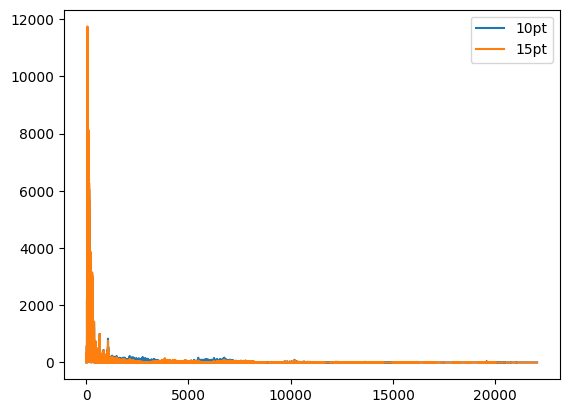

In [20]:
from thinkdsp import Wave
s10   = Wave(filtered, framerate=sr).make_spectrum()
s15  = Wave(filtered_15, framerate=sr).make_spectrum()
s10.plot(label='10pt')
s15.plot(label='15pt')
plt.legend()
plt.show()

## Part 2: Convolution reverb

This example uses LTI system theory to characterize the acoustics of a recording space and simulate the effect this space would have on the sound of a violin performance.

**Exercise 2.1**: run and study the following code.

**Exercise 2.2**: repeat the process using another 'space' and sound. You can download sounds from freesound.org or... record your own sounds!

In [21]:
import matplotlib.pyplot as plt
import numpy as np
import librosa as lr
from IPython.display import Audio

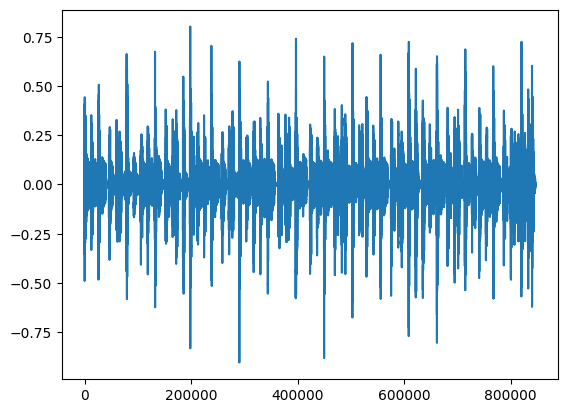

In [22]:
system, sr = lr.load("./553495__mvrasseli__4-4-100bpm-streets-funky-loop.wav", sr=44100)
plt.plot(system)

In [23]:
audio_system = Audio(data=system, rate=sr)
audio_system

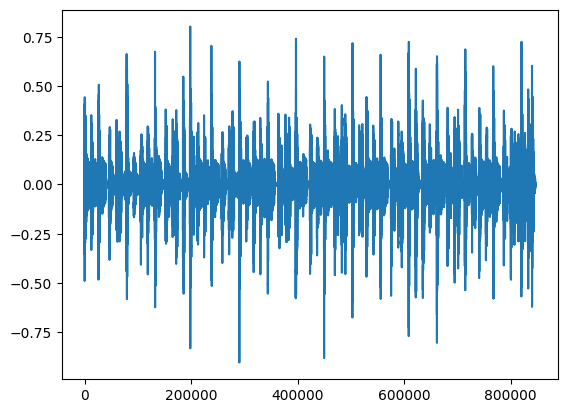

In [24]:
signal, sr = lr.load("./553495__mvrasseli__4-4-100bpm-streets-funky-loop.wav", sr=44100)
plt.plot(signal)

In [25]:
audio_signal = Audio(data=signal, rate=sr)
audio_signal

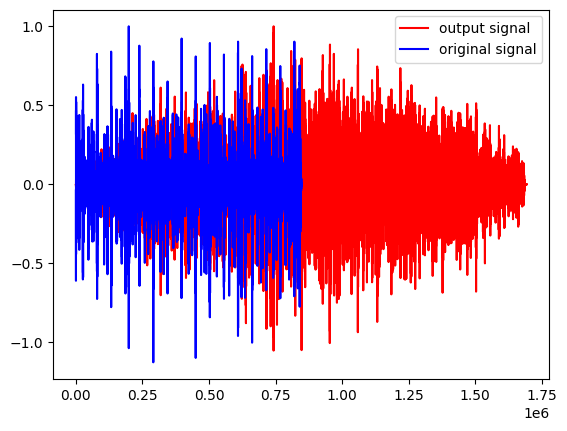

In [26]:
res = np.convolve(signal, system)

# plot
# normalise it
res = res / np.max(res) 
signal = signal / np.max(signal)
plt.plot(res, 'r-', label='output signal')
plt.plot(signal,'b-', label='original signal')
plt.legend(loc="upper right")

## want to hear it? 
audio = Audio(data=res, rate=sr)
audio

### **Exercise 2.2:** 

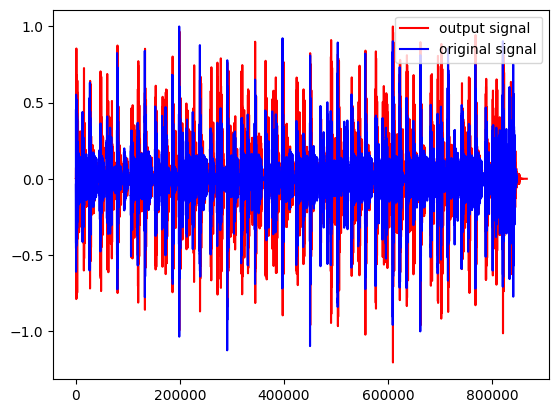

In [29]:
system, sr = lr.load("./41424__sandyrb__mtfp-kick-001.wav", sr=44100)
audio_system = Audio(data=system, rate=sr)
signal, sr = lr.load("./553495__mvrasseli__4-4-100bpm-streets-funky-loop.wav", sr=44100)
audio_signal = Audio(data=signal, rate=sr)
res = np.convolve(signal, system)
# plot
res = res / np.max(res)
signal = signal / np.max(signal)
plt.plot(res, 'r-', label='output signal')
plt.plot(signal,'b-', label='original signal')
plt.legend(loc="upper right")
## want to hear it?
audio = Audio(data=res, rate=sr)
audio

## Part 3: Convolution with impulses

In this part, we are going to demonstrate the effect of convolution with impulses.

**Exercise 3.1**: run and analyse the following code.

**Exercise 3.2**: repeat the exercise using another number of impulses and amplitudes. Feel free to experiment with other sounds!

Let's create a sequence of 4 impulses with diminishing amplitudes:

In [27]:
import matplotlib.pyplot as plt
import numpy as np
import librosa as lr
from IPython.display import Audio

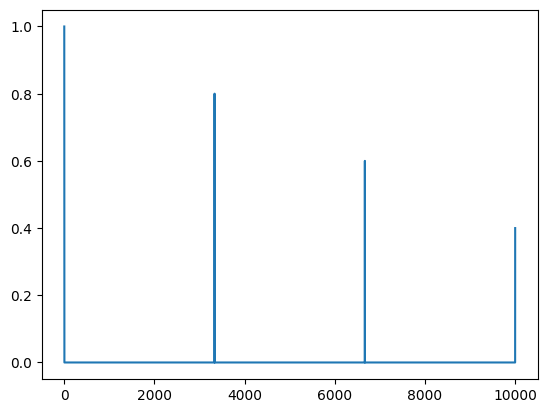

In [28]:
impulses = np.zeros( (10000,) )   
impulses[0] = 1.0                # index range sets location, the value the impulse amplitude
impulses[3333] = 0.8
impulses[6666] = 0.6
impulses[9999] = 0.4

plt.plot(impulses)

Let's experiment with a short bell sound.

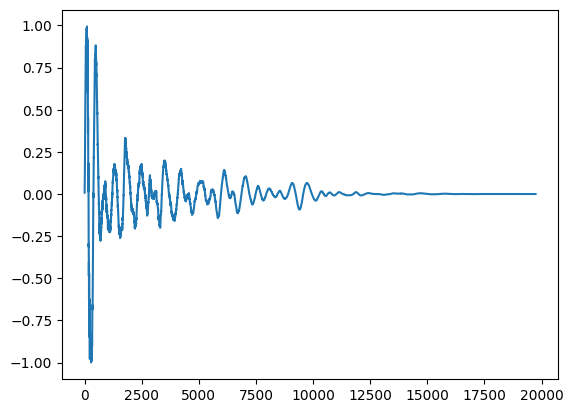

In [31]:
kick, sr = lr.load("./41424__sandyrb__mtfp-kick-001.wav", sr=44100)
plt.plot(kick)

In [32]:
audio_kick = Audio(data=bell, rate=sr)
audio_kick

If we convolve the wave with the impulses, we get 4 shifted, scaled copies of the original sound.

In [33]:
out = np.convolve(kick, impulses)

audio = Audio(data=out, rate=sr)
audio

In [61]:
impulses = np.zeros( (10000,) )
impulses[0] = 0.4
impulses[8888] = 0.6
impulses[9999] = 1.0

kick, sr = lr.load('./41424__sandyrb__mtfp-kick-001.wav',sr=44100)
audio_kick = Audio(data=kick, rate=sr)
audio_kick

In [62]:
convolved = np.convolve(kick,impulses)
audio_convolved = Audio(data=convolved, rate=sr)
audio_convolved

## Part 4: Amplitude modulation (AM)

It is important not to confuse 'convolve two signals' with 'multiply (term by term) two signals'.

In this part, we are going to introduce the Amplitude modulation (AM) technique. We will see the differences between convolve and multiply signals.

**Exercise 4.1**: run and analyse the following code.

**Exercise 4.2**: repeat the exercise experiment with other sounds and carrier frequencies (for example, 10 kHz).

Is it possible to multiply term by term two signals? Yes. For example, Amplitude modulation (AM) technique is a modulation technique based on multiplaying two signals (an audio signal by a carrier signal).

First let's load a recording.

In [71]:
from thinkdsp import read_wave
from thinkdsp import decorate

wave = read_wave('./41424__sandyrb__mtfp-kick-001.wav')
wave.make_audio()

Here's what the spectrum looks like:

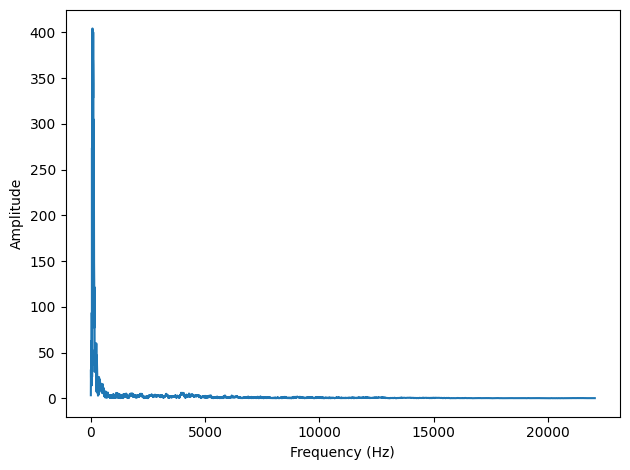

In [72]:
spectrum = wave.make_spectrum()
spectrum.plot()
decorate(xlabel='Frequency (Hz)')
decorate(ylabel='Amplitude')

Amplitude modulation works by multiplying the input signal by a "carrier wave", which is a cosine. In this example, the carrier is a cosine of 15 kHz, but we could use any other frequency.

In [73]:
from thinkdsp import CosSignal

carrier_sig = CosSignal(freq=15000)
carrier_wave = carrier_sig.make_wave(duration=wave.duration, framerate=wave.framerate)

The * operator performs elementwise multiplication.

In [74]:
modulated = wave * carrier_wave

The result seems a silence.

In [75]:
modulated.make_audio()

But, if we analyse the spectrum... the signal is still there!

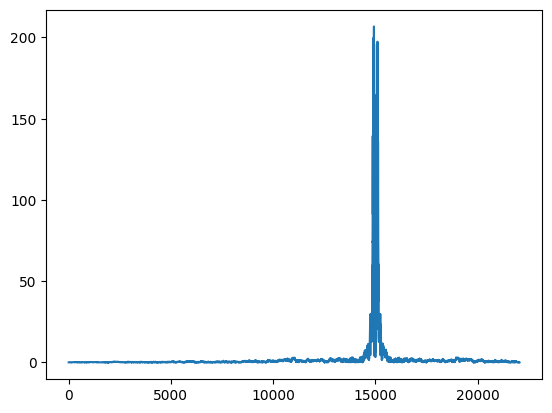

In [76]:
modulated_spectrum = modulated.make_spectrum()
modulated_spectrum.plot()

Why? AM modulation has the effect of splitting the spectrum in two halves and shifting the frequencies by the carrier frequency.

To recover the signal, we modulate it again.

In [77]:
demodulated = modulated * carrier_wave

Each half of the spectrum gets split and shifted again.  Two of the quarters get shifted to 0 and added up.  The other two are at $\pm$20Khz

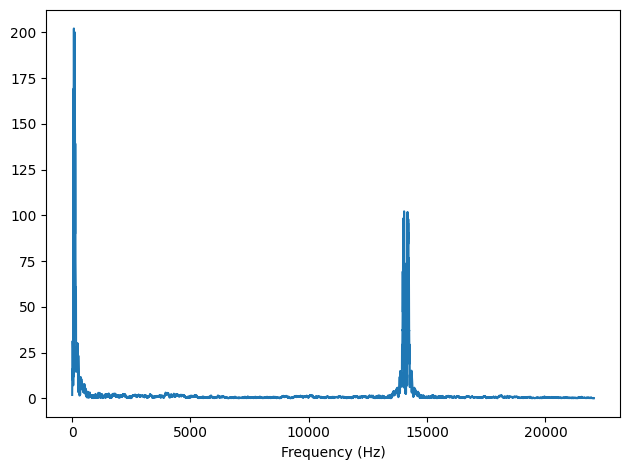

In [78]:
demodulated_spectrum = demodulated.make_spectrum()
demodulated_spectrum.plot()
decorate(xlabel='Frequency (Hz)')

As you can see, the result is not exactly as the original wave. Some extra components at high frequencies have been created.
But if we compare the input and output signals, they are pretty close.

In [79]:
demodulated.make_audio()

If the high frequency components bother us, we can clobber them by applying a low pass filter.  In this example, I use a "brick wall" filter that cuts off sharply at 15 kHz.  In real applications, we would use a more gentle filter.

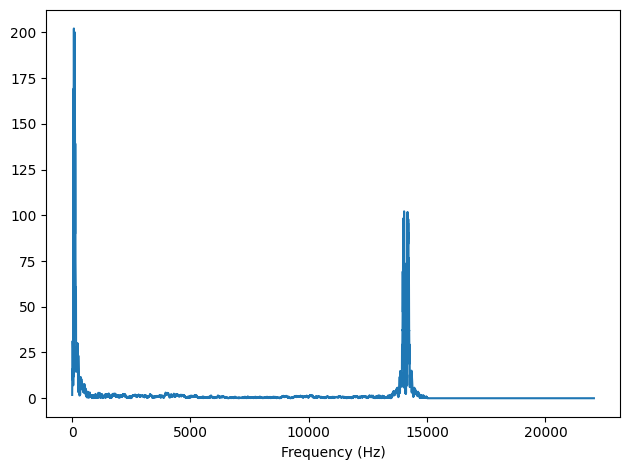

In [80]:
demodulated_spectrum.low_pass(15000)
demodulated_spectrum.plot()
decorate(xlabel='Frequency (Hz)')

Here's what it sounds like after filtering.

In [81]:
filtered = demodulated_spectrum.make_wave()
filtered.make_audio()

Note: This lab is based on examples from [Think DSP](https://greenteapress.com/thinkdsp/thinkdsp.pdf) by Allen B. Downey.